In [1]:
# Import Libraries
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import numpy as np
import geopandas as gpd
import plotly.express as px

In [2]:
# Defining colors 
class colorss:
    yellows=['#ffffd4','#fee391','#fec44f','#fe9929','#d95f0e','#993404','#a70000','#ff5252','#ff7b7b','#ffbaba']
    greens=['#ffffd4','#fee391','#fec44f','#fe9929','#d9f0a3','#addd8e','#78c679','#41ab5d','#238443','#005a32']
cmaps=['flare','icefire','bwr_r','Accent','Spectral','RdGy','afmhot_r','afmhot','inferno','seismic','vlag','vlag_r']

In [3]:
# Loading and reading the dataset
df = pd.read_csv('yield_df.csv')
df

,Unnamed: 0,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
0,0,Albania,Maize,1990,36613,1485.0,121.00,16.37
1,1,Albania,Potatoes,1990,66667,1485.0,121.00,16.37
2,2,Albania,"Rice, paddy",1990,23333,1485.0,121.00,16.37
3,3,Albania,Sorghum,1990,12500,1485.0,121.00,16.37
4,4,Albania,Soybeans,1990,7000,1485.0,121.00,16.37
...,...,...,...,...,...,...,...,...
28237,28237,Zimbabwe,"Rice, paddy",2013,22581,657.0,2550.07,19.76
28238,28238,Zimbabwe,Sorghum,2013,3066,657.0,2550.07,19.76
28239,28239,Zimbabwe,Soybeans,2013,13142,657.0,2550.07,19.76
28240,28240,Zimbabwe,Sweet potatoes,2013,22222,657.0,2550.07,19.76


In [4]:
# Dataset Description:
# Area	Country names that plant crops
# Item	Types of crops planted
# Year	Time of planted crops in years 1990-2013
# average_rain_fall_mm_per_year	Average rain fall per year
# pesticides_tonnes	Pesticides used in tonnes
# avg_temp	Average temperature
# hg/ha_yield	Crops yield production value in hectogram per hectare (Hg/Ha)

In [5]:
# Dataset Basic Information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28242 entries, 0 to 28241
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Unnamed: 0                     28242 non-null  int64  
 1   Area                           28242 non-null  object 
 2   Item                           28242 non-null  object 
 3   Year                           28242 non-null  int64  
 4   hg/ha_yield                    28242 non-null  int64  
 5   average_rain_fall_mm_per_year  28242 non-null  float64
 6   pesticides_tonnes              28242 non-null  float64
 7   avg_temp                       28242 non-null  float64
dtypes: float64(3), int64(3), object(2)
memory usage: 1.7+ MB


In [6]:
# Observations:

# Number of Entries: The dataset consists of 28242 entries, ranging from index 0 to 28241.
# Columns: There are 8 columns in the dataset.
# Data Types:
#   Most of the columns (6 out of 8) are of the int64 & float64 data type.
#   Only the Item and Area columns are of the object data type.
# Missing Values: There doesn't appear to be any missing values in the dataset as each column has 28242 non-null entries.

In [7]:
# Summary Statistics for Numerical Variables
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,28242.0,14120.500000,8152.907488,0.00,7060.2500,14120.50,21180.75,28241.00
Year,28242.0,2001.544296,7.051905,1990.00,1995.0000,2001.00,2008.00,2013.00
hg/ha_yield,28242.0,77053.332094,84956.612897,50.00,19919.2500,38295.00,104676.75,501412.00
average_rain_fall_mm_per_year,28242.0,1149.055980,709.812150,51.00,593.0000,1083.00,1668.00,3240.00
pesticides_tonnes,28242.0,37076.909344,59958.784665,0.04,1702.0000,17529.44,48687.88,367778.00
avg_temp,28242.0,20.542627,6.312051,1.30,16.7025,21.51,26.00,30.65


In [8]:
# Analysis:

# average_rain_fall_mm_per_year: The average rainfall per year is approximately 1149, with the least rainfall being 51 
# and the most 3240.

# pesticides_tonnes: The mean pesticides used in tonnes is a whopping 37077 tonnes, with minimum as little as 0.04 
# and maximum as huge as 367778 tonnes.

# hg/ha_yield: The average crop production yield is 77053.3. Ranging from 50 all the way to 501412 hectograms per hectare.

In [9]:
# Summary Statistics for Categorical Variables
df.describe(include='object')

,Area,Item
count,28242,28242
unique,101,10
top,India,Potatoes
freq,4048,4276


In [10]:
# Categorical Features (object data type):

# Area: There are 101 unique countries/areas, with India being the most frequent category, occurring 4048 times out of 28242 
# entries.

# Item: 10 unique types of crops are present. The most common type is "Potatoes", occurring 4276 times.

In [11]:
# EDA
df.drop("Unnamed: 0", axis=1,inplace=True)
df

,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
0,Albania,Maize,1990,36613,1485.0,121.00,16.37
1,Albania,Potatoes,1990,66667,1485.0,121.00,16.37
2,Albania,"Rice, paddy",1990,23333,1485.0,121.00,16.37
3,Albania,Sorghum,1990,12500,1485.0,121.00,16.37
4,Albania,Soybeans,1990,7000,1485.0,121.00,16.37
...,...,...,...,...,...,...,...
28237,Zimbabwe,"Rice, paddy",2013,22581,657.0,2550.07,19.76
28238,Zimbabwe,Sorghum,2013,3066,657.0,2550.07,19.76
28239,Zimbabwe,Soybeans,2013,13142,657.0,2550.07,19.76
28240,Zimbabwe,Sweet potatoes,2013,22222,657.0,2550.07,19.76


In [12]:
# Removing countries with less than 100 record
country_counts =df['Area'].value_counts()
countries_to_drop = country_counts[country_counts < 100].index.tolist()
df_filtered = df[~df['Area'].isin(countries_to_drop)]
df = df_filtered.reset_index(drop=True)

# Reading dataset
df

,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
0,Algeria,Maize,1990,16500,89.0,1828.92,17.48
1,Algeria,Potatoes,1990,78936,89.0,1828.92,17.48
2,Algeria,"Rice, paddy",1990,28000,89.0,1828.92,17.48
3,Algeria,Sorghum,1990,16571,89.0,1828.92,17.48
4,Algeria,Wheat,1990,6315,89.0,1828.92,17.48
...,...,...,...,...,...,...,...
26292,Zimbabwe,"Rice, paddy",2013,22581,657.0,2550.07,19.76
26293,Zimbabwe,Sorghum,2013,3066,657.0,2550.07,19.76
26294,Zimbabwe,Soybeans,2013,13142,657.0,2550.07,19.76
26295,Zimbabwe,Sweet potatoes,2013,22222,657.0,2550.07,19.76


In [13]:
# Copying the data to datacorr variable
datacorr=df.copy()

In [16]:
# Encoding categorical features:
# This code block converts categorical columns of the dataframe 'datacorr' into numeric values.
# 'LabelEncoder' is used to encode labels with value between 0 and n_classes-1 where n is the number of distinct labels.
# This transformation is applied to each categorical column in the DataFrame.
from sklearn.preprocessing import LabelEncoder
categorical_columns = datacorr.select_dtypes(include=['object']).columns.tolist()
label_encoder = LabelEncoder()
for column in categorical_columns:
    datacorr[column] = label_encoder.fit_transform(datacorr[column])

<Axes: >

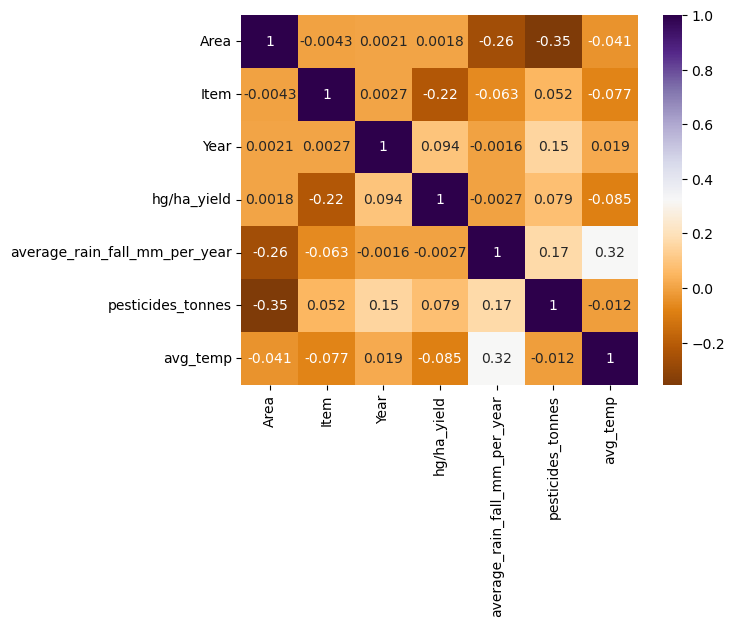

In [17]:
# Generating a heatmap of correlations:
# This code uses seaborn's heatmap function to visualize the correlation matrix of the dataframe 'datacorr'.
# 'annot=True' displays the correlation coefficients in the heatmap.
# The color map 'PuOr' (Purple-Orange) is used to distinguish positive from negative correlations.
sns.heatmap(datacorr.corr(), annot=True, cmap='PuOr')

In [18]:
# Conclusion:

# Area: There's a strong correlation between Area and pesticides_tonnes, along with Area and average rainfall
# Items: There's a strong correlation between Item and hg/ha_yield

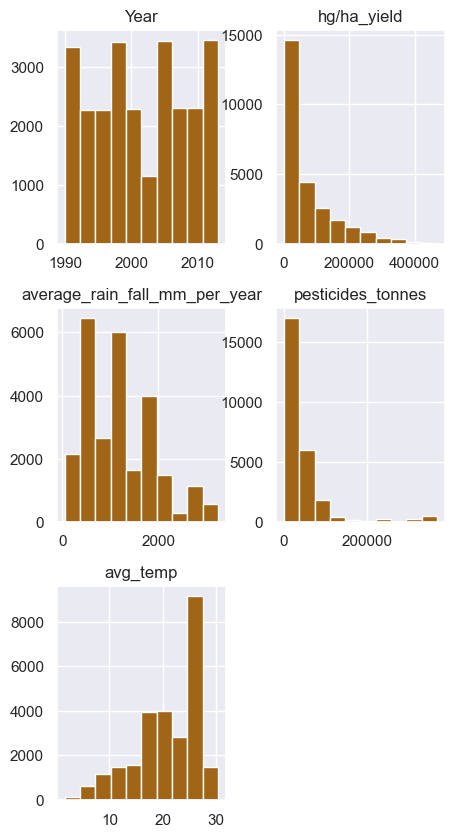

In [19]:
# Setting up the plot aesthetics and generating histograms:
# The 'sns.set' function configures the aesthetic style of the plots. 
# Here, it sets the color palette to 'BrBG' (Brown-Blue-Green) for better visual distinction.
# 'df.hist' generates histograms for all numerical columns in the DataFrame 'df'.
# 'figsize=(5,10)' specifies the size of the figure to ensure all histograms are clearly visible.
sns.set(palette='BrBG')
df.hist(figsize=(5,10));

In [20]:
# Conclusion:

# rainfall: Most rainfall is between 0-1000 and very few is around 3000
# pesticides_tonnes: The majority of used pesticides is little to zero
# avg_temp: Most average temperatures is around 25. *hg/ha yield: There is a vast majority of yield production around 0

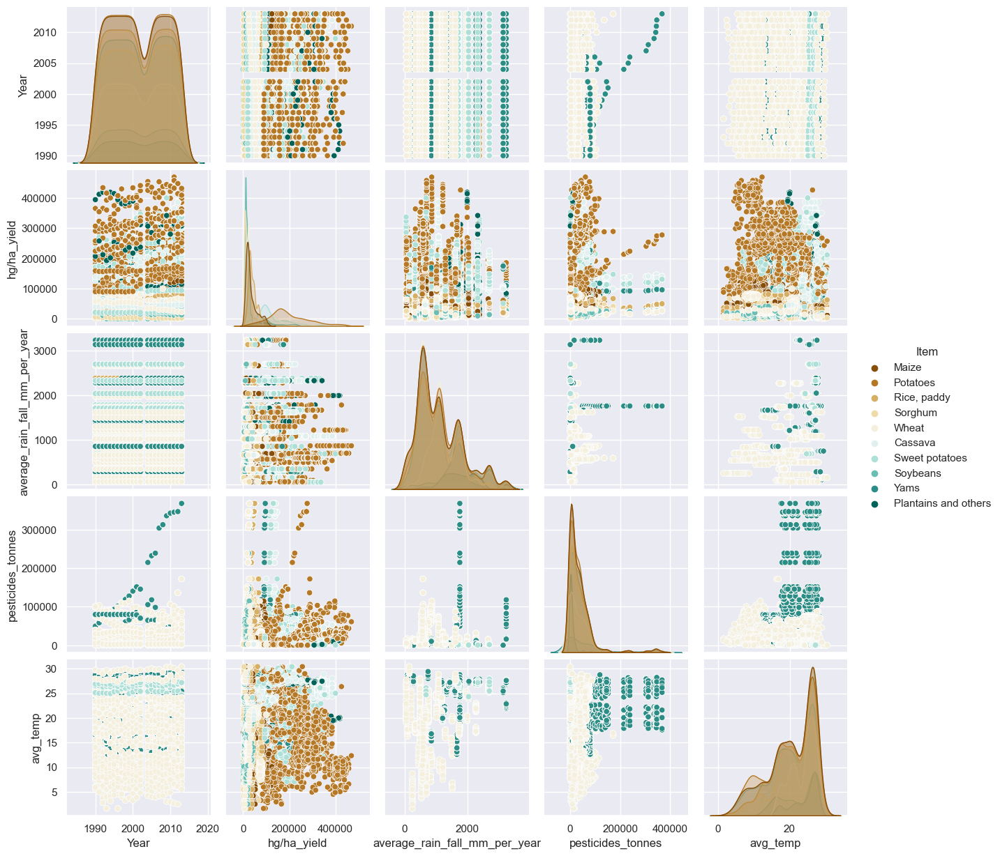

In [21]:
# Generating pairplot visualizations:
# The 'sns.pairplot' function creates a grid of scatter plots for each pair of numerical variables in the DataFrame 'df'.
# The 'hue' parameter is set to 'Item', which means the data points in each plot will be colored based on the 'Item' category.
# 'kind='scatter'' specifies that the plots will be scatter plots.
# The color palette 'BrBG' (Brown-Blue-Green) is used to differentiate between categories defined by the 'Item' column.
sns.pairplot(data=df, hue='Item', kind='scatter', palette='BrBG')

<Axes: xlabel='Year'>

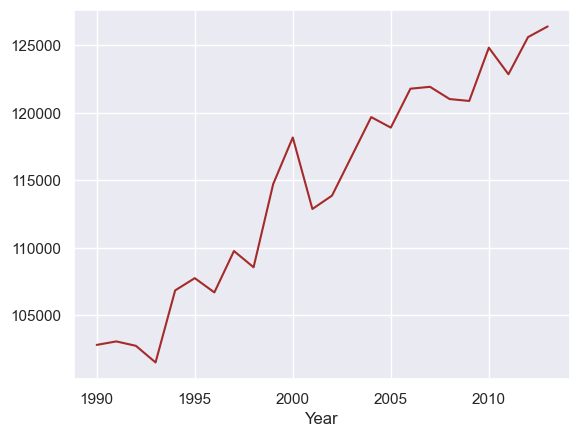

In [22]:
# Analyzing and plotting the average yield of Yams over the years:
# First, a subset of the original DataFrame 'df' is created where the 'Item' column is equal to 'Yams'. This subset is stored in 'df2'.
# Then, using 'groupby', the data is grouped by the 'Year', and the mean yield ('hg/ha_yield') for Yams for each year is calculated.
# The resulting time series data is plotted as a line graph with the color set to brown.
df2 = df[df['Item'] == 'Yams']
df2.groupby('Year')['hg/ha_yield'].mean().plot(color='brown')

In [23]:
# Conclusion:

# Items:
#   yams: It appears that yams uses a lot of pesticides, grow on all rainfall ranges
#   wheat: Wheat thrives on all average temperature ranges and grows on average to no rainfall

# year:
#   2003-2013: Starting from 2003 to 2013, more and more pesticides were used on yams to increase its productivity

# hg/ha_yield: Sorghum and Soybeans are lowest in yield production while potatoes are most popular

In [24]:
# Loading geographical data and merging with the main dataset:
# The 'gpd.read_file' function is used to load a GeoJSON file containing country geometries from a given URL
# This geographical data is stored in the GeoDataFrame 'data'
# The 'data' GeoDataFrame is then merged with the main DataFrame 'df' based on country names
# The merge is done by matching the 'NAME' column in 'data' with the 'Area' column in 'df', using a left join
# The resulting merged GeoDataFrame 'merged_data' contains both the geographical and main dataset information
geojson_url = "https://raw.githubusercontent.com/nvkelso/natural-earth-vector/master/geojson/ne_110m_admin_0_countries.geojson"
data = gpd.read_file(geojson_url)

merged_data = data.merge(df, left_on='NAME', right_on='Area', how='left')

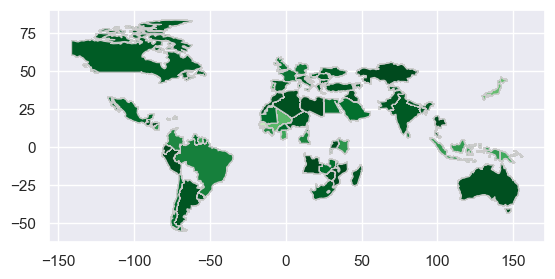

In [25]:
# Visualizing yield data on a world map:
# Using the 'plot' method of GeoPandas, the 'merged_data' GeoDataFrame is visualized on a map
# The 'column' parameter is set to 'hg/ha_yield' to depict yield data for each country
# The 'cmap' parameter with the value 'Greens_r' is used to set the color map for the visualization, with higher yields shown in darker shades of green
# Line width ('linewidth') and edge color ('edgecolor') are set to enhance the visibility of country borders
# Uncomment the first line to create a figure and axes with a specific size, and the commented line for adding a title
# 'plt.show()' displays the final map visualization
# fig, ax = plt.subplots(figsize=(15, 10))
merged_data.plot(column='hg/ha_yield', cmap='Greens_r', linewidth=0.8, edgecolor='0.8')
# plt.title("Countries")
plt.show()

In [26]:
# Removing the 'merged_data' DataFrame from memory:
# The 'del' keyword is used to delete the 'merged_data' DataFrame to free up memory resources
# This is useful when the DataFrame is large and no longer needed, ensuring efficient memory usage
del merged_data

In [27]:
# Removing the 'data' GeoDataFrame from memory:
# The 'del' keyword is used to delete the 'data' GeoDataFrame to free up memory resources
# This is helpful in managing memory usage, especially if 'data' is no longer required in the subsequent parts of the analysis
del data

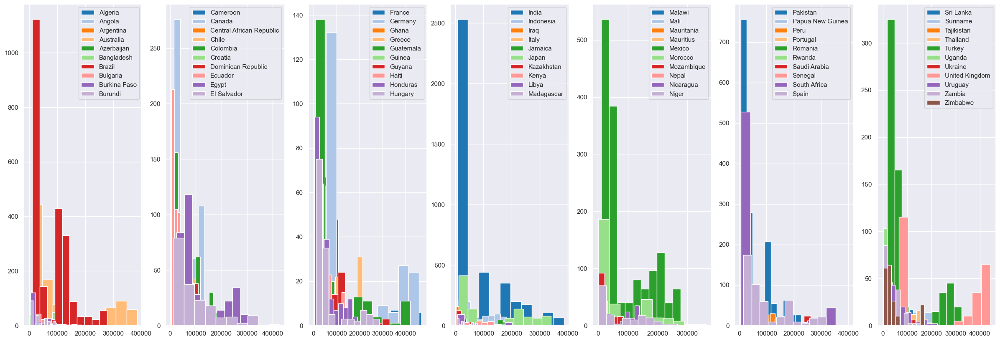

In [28]:
# import plotly.io as pio
# pio.renderers.default = 'notebook'

palette = sns.color_palette('tab20', 21,as_cmap=True)
num_plots = 7
areas_per_plot = 10

# Get unique areas 
unique_areas = sorted(df['Area'].unique())

# Split into chunks
area_chunks = [unique_areas[i:i+areas_per_plot] for i in range(0, len(unique_areas), areas_per_plot)]
area_chunks[-2] = unique_areas[-11:] 
fig, axs = plt.subplots(ncols=num_plots, figsize=(30, 10))
j=0
for i, ax in enumerate(axs):

    plot_df = df[df['Area'].isin(area_chunks[i])]
    for i, area in enumerate(plot_df['Area'].unique()):
       data = plot_df[plot_df['Area'] == area]
       ax.hist(data['hg/ha_yield'], facecolor=palette(i), label=area)

    ax.legend()
    j+=1
   
plt.show()

In [29]:
# Iterating through area chunks and analyzing crop yields:
# The loop iterates through seven chunks of areas
# In each iteration, a subset of the main DataFrame 'df' is created for the areas in the current chunk
# This subset ('plot_df') is grouped by both 'Area' and 'Item', and the mean yield ('hg/ha_yield') for each group is calculated
# The resulting DataFrame 'dk' is then sorted in ascending order based on yield
# The 'head()' method is used to display the top 5 rows of the sorted DataFrame for each area chunk, showing areas with the lowest average yields
for i in range(0,7):
    plot_df = df[df['Area'].isin(area_chunks[i])]
    dk = plot_df.groupby(['Area', 'Item'])['hg/ha_yield'].mean().to_frame()
    dg = dk.sort_values(by=['hg/ha_yield'], ascending=True)
    display(dg.head())

hg/ha_yield
Area       Item                 
Angola     Sorghum   2926.769231
Azerbaijan Sorghum   3324.166667
Angola     Soybeans  4235.538462
           Maize     5753.869565
Azerbaijan Soybeans  7599.850000

hg/ha_yield
Area                     Item                  
Ecuador                  Wheat      7111.956522
Cameroon                 Soybeans   7566.782609
Central African Republic Sorghum    9353.913043
                         Maize     10250.869565
Cameroon                 Sorghum   11521.304348

hg/ha_yield
Area     Item                 
Honduras Wheat     5574.130435
Haiti    Maize     7905.565217
         Sorghum   8157.913043
Ghana    Sorghum  10291.347826
Honduras Sorghum  10863.782609

hg/ha_yield
Area       Item                 
Madagascar Soybeans  6267.173913
           Sorghum   6452.304348
Kenya      Sorghum   7744.478261
India      Sorghum   8452.434783
Libya      Wheat     8459.521739

,,hg/ha_yield
Area,Item,
Niger,Sorghum,2592.913043
Mauritania,Sorghum,4673.869565
Mozambique,Sorghum,4830.304348
Malawi,Sorghum,6403.086957
Morocco,Sorghum,6594.739130


,,hg/ha_yield
Area,Item,
Pakistan,Sorghum,6056.043478
Rwanda,Soybeans,6664.869565
Senegal,Sorghum,8159.173913
Pakistan,Soybeans,9276.000000
Rwanda,Sorghum,10969.478261


,,hg/ha_yield
Area,Item,
Tajikistan,Soybeans,941.750000
Zimbabwe,Sorghum,3864.956522
Zambia,Sorghum,6809.608696
Thailand,Wheat,7547.000000
Suriname,Soybeans,9039.869565


In [30]:
# Analyzing top crop yields in different area chunks:
# The loop iterates through seven specified chunks of areas.
# For each chunk, a subset of the main DataFrame 'df' is created, focusing only on the areas within that chunk.
# This subset ('plot_df') is then grouped by 'Area' and 'Item', calculating the mean yield ('hg/ha_yield') for each group.
# The resulting DataFrame 'dk' is sorted in descending order based on the yield values.
# The 'head()' method displays the top 5 rows of 'dg', showing areas and items with the highest average yields in each chunk.
for i in range(0,7):
    plot_df = df[df['Area'].isin(area_chunks[i])]
    dk = plot_df.groupby(['Area', 'Item'])['hg/ha_yield'].mean().to_frame()
    dg = dk.sort_values(by=['hg/ha_yield'], ascending=False)
    display(dg.head())

,,hg/ha_yield
Area,Item,
Australia,Potatoes,330944.826087
Argentina,Potatoes,262059.173913
Australia,Sweet potatoes,257610.826087
Brazil,Potatoes,196056.000000
Algeria,Potatoes,182413.956522


hg/ha_yield
Area        Item                               
Egypt       Sweet potatoes        261369.347826
            Potatoes              235444.956522
El Salvador Potatoes              211362.304348
            Plantains and others  198605.217391
Chile       Potatoes              184835.260870

hg/ha_yield
Area      Item                               
France    Potatoes              395037.260870
Germany   Potatoes              386553.347826
Guatemala Plantains and others  291096.304348
          Potatoes              241157.869565
Hungary   Potatoes              210372.782609

hg/ha_yield
Area  Item                         
Japan Potatoes        311005.260870
India Cassava         282234.434783
Italy Potatoes        237861.347826
Japan Sweet potatoes  237639.391304
      Yams            211343.434783

,,hg/ha_yield
Area,Item,
Mexico,Potatoes,228553.695652
Morocco,Potatoes,217065.695652
Mauritius,Potatoes,211356.869565
Mali,Potatoes,195653.869565
Mexico,Sweet potatoes,194611.913043


,,hg/ha_yield
Area,Item,
South Africa,Potatoes,297195.434783
Spain,Potatoes,251421.695652
Saudi Arabia,Potatoes,223336.652174
Senegal,Potatoes,180499.608696
Papua New Guinea,Yams,172521.173913


hg/ha_yield
Area           Item                               
United Kingdom Potatoes              406131.695652
Turkey         Potatoes              265486.565217
Suriname       Plantains and others  253966.913043
               Cassava               191282.478261
Tajikistan     Potatoes              176549.190476

In [31]:
# Grouping and sorting crop yields by area and item:
# The DataFrame 'df' is grouped by both 'Area' and 'Item' to calculate the average yield ('hg/ha_yield') for each combination
# The result is converted into a DataFrame 'dk' with mean yields for each area-item pair
# The 'dk' DataFrame is then sorted in descending order based on the average yields
# This helps in identifying the highest yielding crops across all areas
dk = df.groupby(['Area', 'Item'])['hg/ha_yield'].mean().to_frame()
dk.sort_values(by=['hg/ha_yield'], ascending=False)

,,hg/ha_yield
Area,Item,
United Kingdom,Potatoes,406131.695652
France,Potatoes,395037.260870
Germany,Potatoes,386553.347826
Australia,Potatoes,330944.826087
Japan,Potatoes,311005.260870
...,...,...
Zimbabwe,Sorghum,3864.956522
Azerbaijan,Sorghum,3324.166667
Angola,Sorghum,2926.769231


In [32]:
# Conclusion:

# Group 0: Australia produced the largest amount of yield harvesting potatoes while Angola has the least yield harvesting sorghum,soybeans and maize
# Group 1: Egypt was producing most yield in this group growing sweet potatoes and potatoes while Ecuador was struggling in harvesting wheat
# Group 2: France and Germany are at the top of yield production both harvesting potatoes while Honduras wasn't in luck harvesting wheat
# Group 3: India soared in growing Cassava and Japan was at the top growing potatoes while Madagascar struggled to grow soybeans and sorghum
# Group 4: Morocco and Mexico shined in yield production of potatoes while Niger failed to have high productions of wheat
# Group 5: Pakistan was struggling in growing sorghum while South Africa Spain, and Saudi Arabia shined in growing Potatoes
# Group 6: Tajikistan failed to harvest large amounts of soybeans while United Kingdom and Turkey produced a myriad of potatoes 

# Top producing countries: United Kingdom, France, Germany, Australia, and Japan
# Top produced Item: potatoes
# Least producing countries: Zimbabwe, Azerbaijan, Angola, Niger, Tajikistan
# Least produced item: sorghum and soybeans

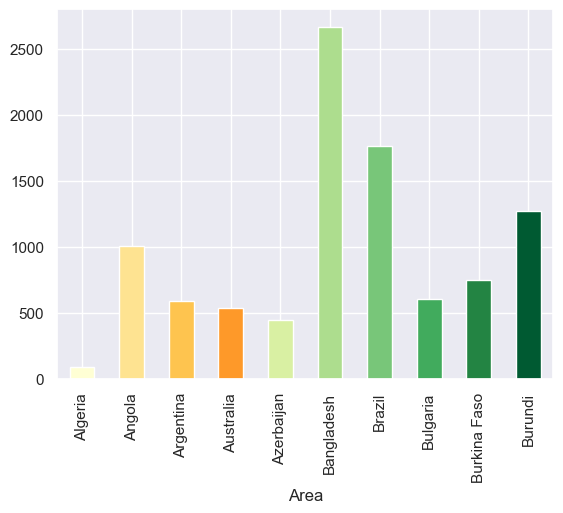

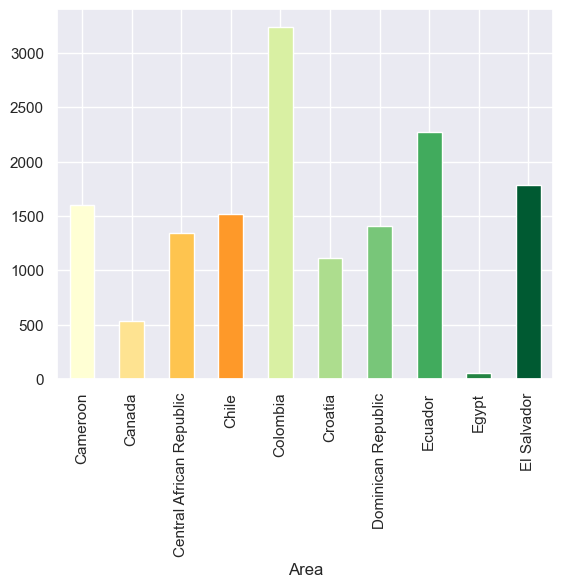

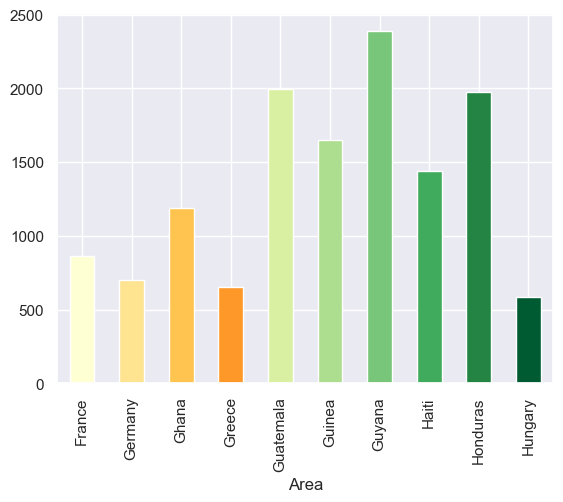

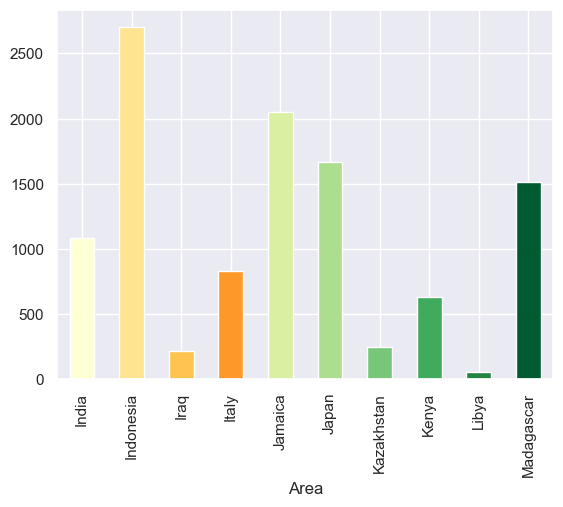

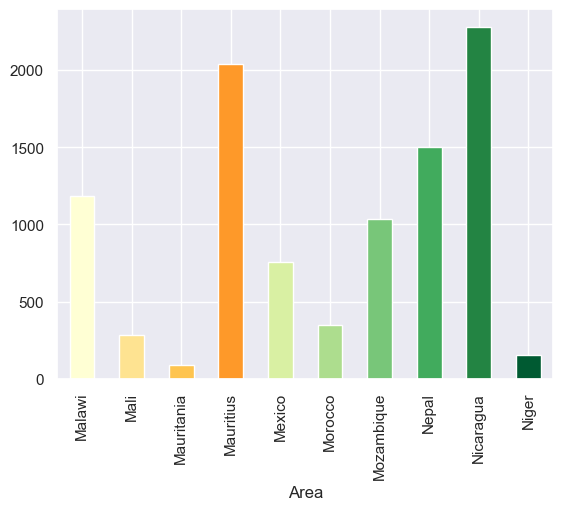

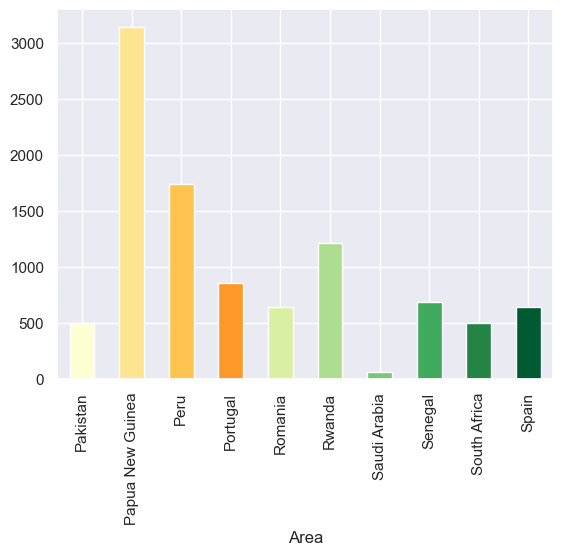

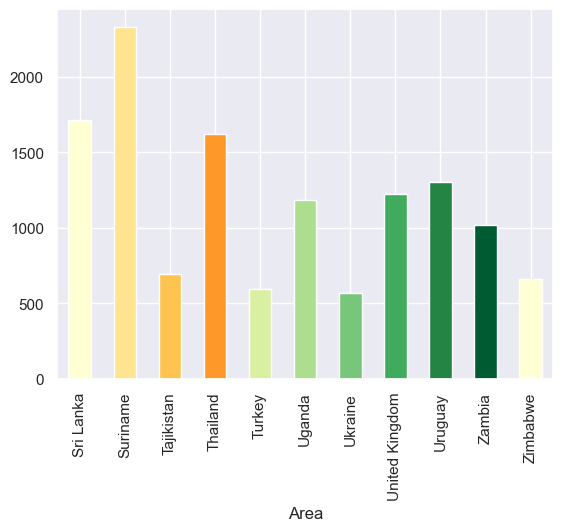

In [33]:
# Visualizing average annual rainfall for different areas:
# The loop iterates through seven predefined chunks of areas
# In each iteration, 'plot_df' is created, containing data only for the areas in the current chunk from 'df'
# The 'plot_df' is then grouped by 'Area', and the mean of 'average_rain_fall_mm_per_year' is calculated
# A bar plot is generated for each area chunk, displaying the average annual rainfall in each area
# The 'rot=0' parameter sets the x-axis labels to be horizontal, and 'plt.xticks(rotation=90)' rotates them for better readability
# 'plt.show()' is called after each plot to display it before moving to the next chunk
# The 'colorss.greens' color scheme is used for the bars in the plot
for i in range(0,7):
    plot_df = df[df['Area'].isin(area_chunks[i])]
    plot_df.groupby(['Area'])['average_rain_fall_mm_per_year'].mean().plot(kind='bar', rot=0, color=colorss.greens)
    plt.xticks(rotation=90)
    plt.show()

In [34]:
# Conclusion:

# Top rainfall countries: Bangladesh, Colombia, Guyana, Indonesia, Nicaragua, Papua New Guinea, Ecuador, and Suriname have rainfall with over 2000 mm
# Least rainfall countries: Saudi Arabia, Pakistan, South Africa, Mali, Mauritania, Morocco, Niger, Libya, Iraq, Egypt, Azerbaijan,and Algeria have rainfall with less than 500 mm

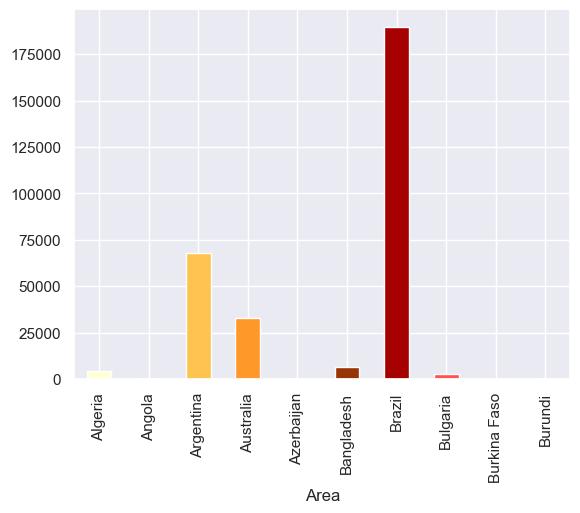

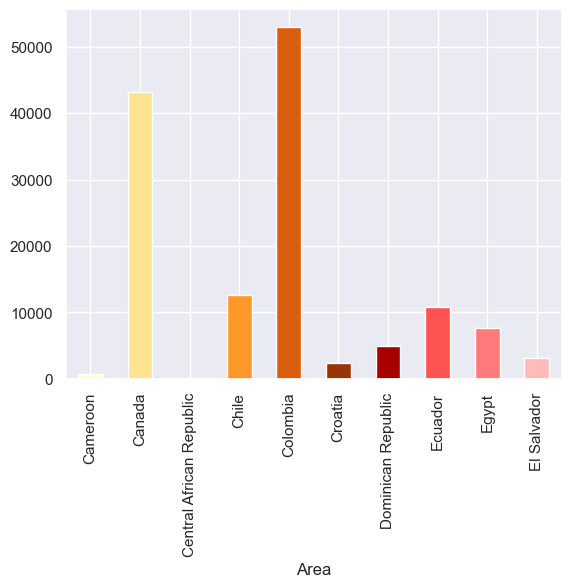

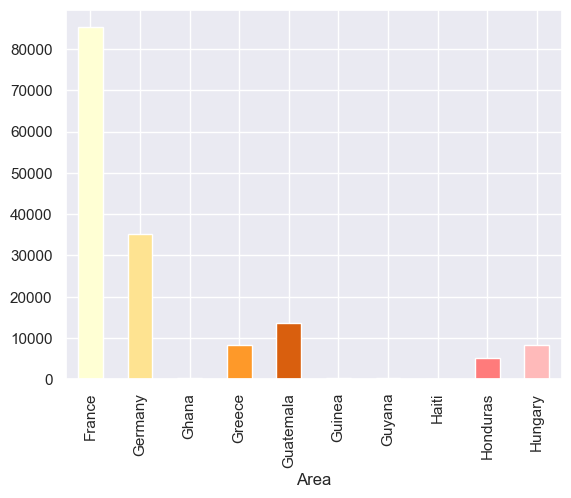

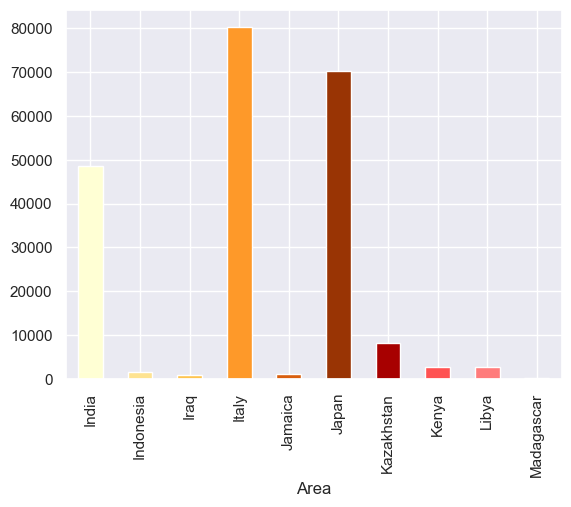

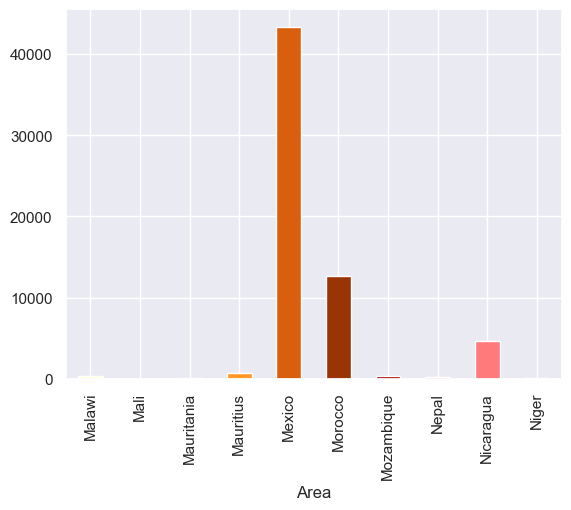

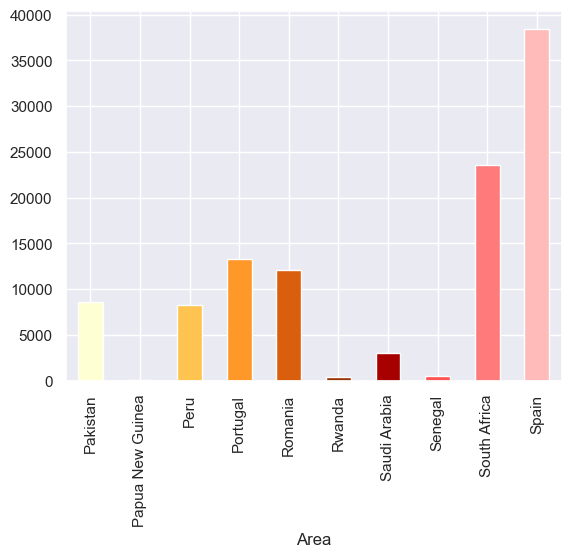

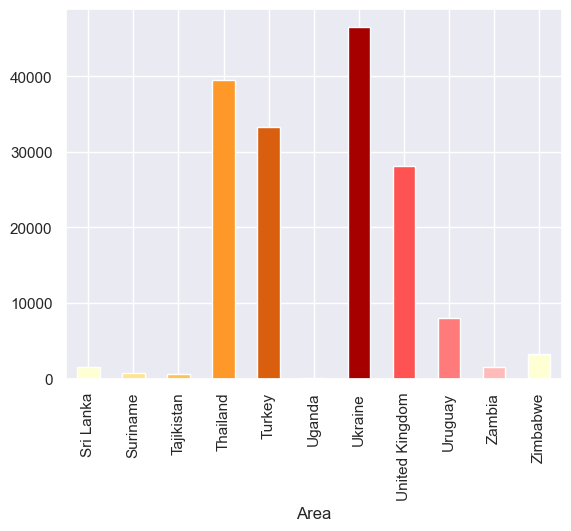

In [35]:
# Generating bar plots for average pesticide usage in different area chunks:
# The loop iterates over seven predefined groups of areas (area_chunks)
# For each group, a subset 'plot_df' is created from the main DataFrame 'df', including only the areas within the current group
# This subset is grouped by 'Area', calculating the average amount of pesticides used ('pesticides_tonnes') for each area
# A bar plot is then generated for each area chunk, displaying the average pesticide usage
# The bars are colored using 'colorss.yellows', and 'rot=0' keeps the x-axis labels horizontal for clarity
# 'plt.xticks(rotation=90)' rotates the x-axis labels for better readability, especially when there are many areas
# Each plot is displayed using 'plt.show()' before moving on to the next area chunk
for i in range(0,7):
    plot_df = df[df['Area'].isin(area_chunks[i])]
    plot_df.groupby(['Area'])['pesticides_tonnes'].mean().plot(kind='bar', rot=0, color=colorss.yellows)
    plt.xticks(rotation=90)
    plt.show()

In [36]:
# Conclusion:

# Top pesticides using countries: Brazil, Italy, Argentina

# France: For a high yield producing country, using over 80000 tonnes of pesticides could be harmful

# Japan: Another high producing country using over 60000 tonnes of pesticides

# Least pesticides using countries: Algeria, Angola, Azerbaijan, Bulgaria, Burkina Faso, Burundi, Cameroon, Cenrral African Republic, Croatia, Egypt, El Salvador,Greece, Guinea, Guyana, Haiti, Honduras, Hungary, Indonesia, Iraq, Jamaica, Kenya, Kazakhstan, Libya, Madagascar, Malawi, Mali, Mauritana, Mauritius, Mozambique, Nepal, Niger, Papua New Guinea, Rwanda, Senegal, Saudi Arabia, Sri Lanka, Suriname, Tajikistan, Uganda, Zambia, Zimbabwe, Uruguay have been using pesticides with less than 10000 tonnes

# All poorly producing yield countries are included in least pesticides usage countries

# Germany, Australia, and United Kingdom are top producing countries and they use an average amount of pesticides around 30000 tonnes

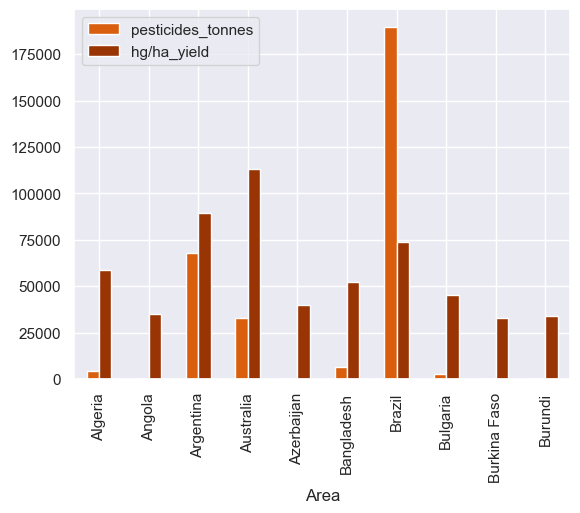

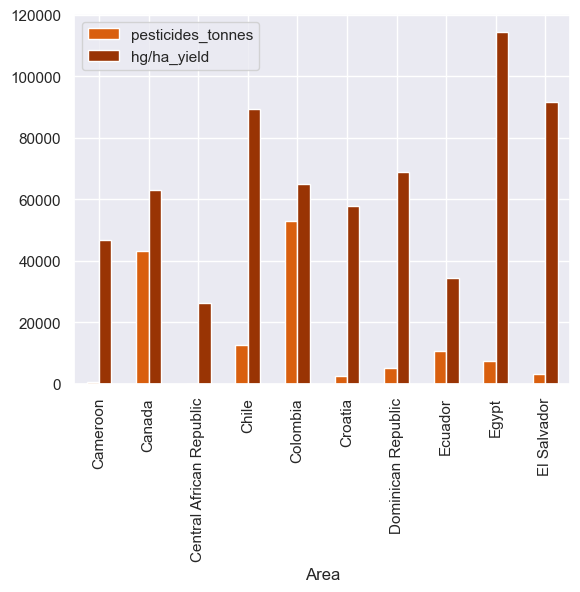

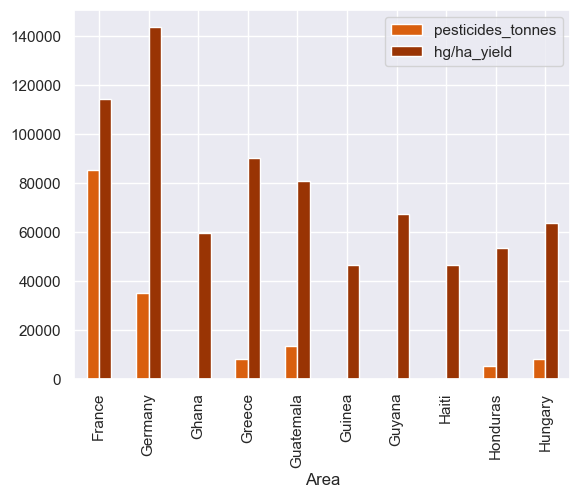

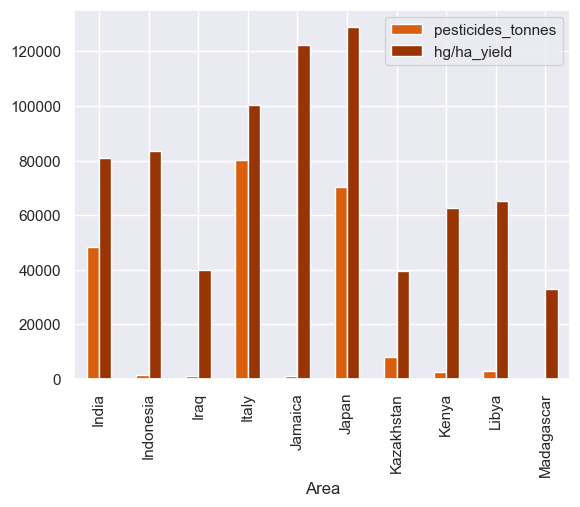

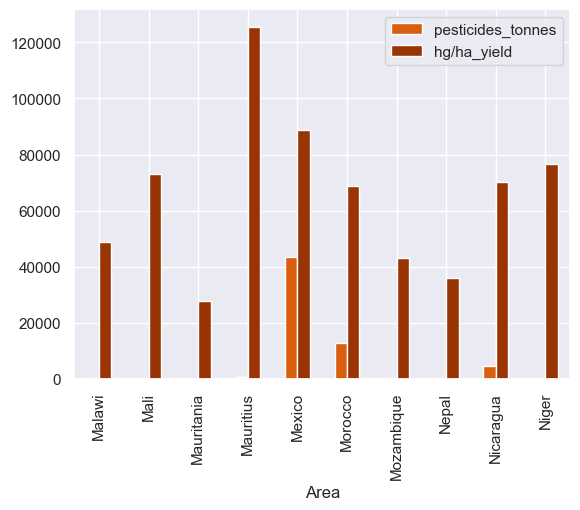

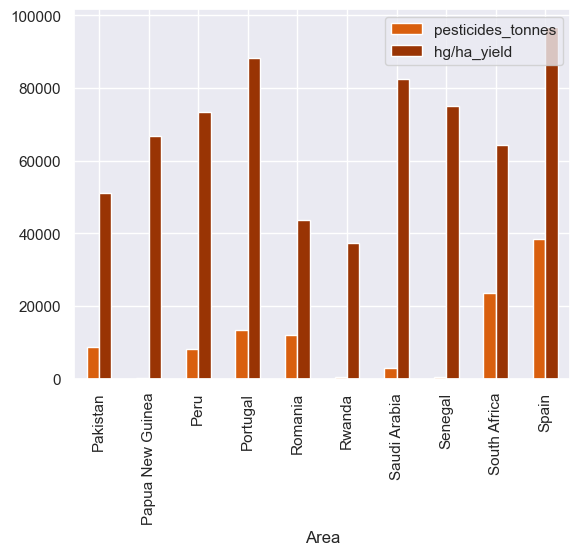

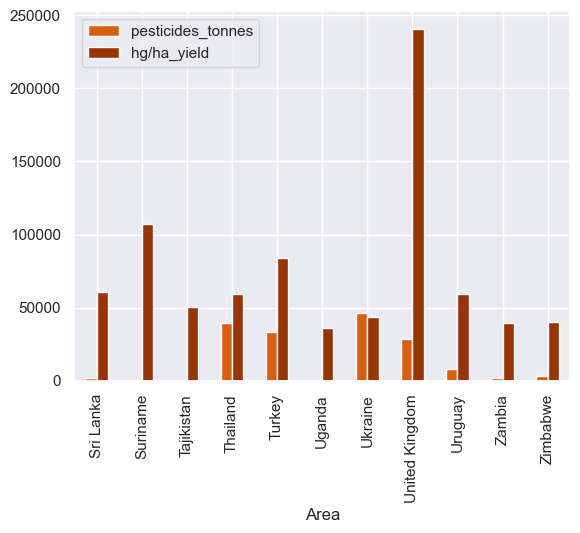

In [37]:
# Creating bar plots for average pesticide usage and yields in different area segments:
# This loop iterates over seven specific groups of areas (defined in 'area_chunks')
# In each iteration, 'plot_df' is a subset of the main DataFrame 'df', containing only the data for areas in the current segment
# The subset is grouped by 'Area', and the means of both 'pesticides_tonnes' and 'hg/ha_yield' are calculated
# A bar plot is generated for each area segment, showing the average pesticide usage and yields side by side
# The 'colorss.yellows[-6:]' specifies the color palette for the bars in the plot
# The 'rot=0' parameter ensures the x-axis labels (Area names) are horizontal, with 'plt.xticks(rotation=90)' then rotating them for readability
# 'plt.show()' is called to display each plot before proceeding to the next group of areas
for i in range(0,7):
    plot_df = df[df['Area'].isin(area_chunks[i])]
    plot_df.groupby('Area')[['pesticides_tonnes', 'hg/ha_yield']].mean().plot(kind='bar', rot=0, color=colorss.yellows[-6:])
    plt.xticks(rotation=90)
    plt.show()

In [38]:
# Generating a scatter plot to visualize the relationship between crop yields and pesticide usage:
# The 'px.scatter' function from Plotly Express is used to create an interactive scatter plot
# The x-axis represents the 'hg/ha_yield' (crop yields), and the y-axis shows 'pesticides_tonnes' (pesticide usage)
# Points are colored by the 'Area' column, distinguishing different areas in the dataset
# The 'color_discrete_sequence=colorss.greens' parameter sets a green color palette for differentiating the areas
# This plot helps in exploring any potential correlations or patterns between crop yields and the amount of pesticides used across different areas
px.scatter(df, x='hg/ha_yield', y='pesticides_tonnes', color="Area", color_discrete_sequence=colorss.greens)

In [39]:
# Define the number of plots and areas per plot
num_plots = 7
areas_per_plot = 10

# Get unique areas from the DataFrame 'df'
unique_areas = sorted(df['Area'].unique())

# Split the unique areas into chunks of size 'areas_per_plot'
area_chunks = [unique_areas[i:i+areas_per_plot] for i in range(0, len(unique_areas), areas_per_plot)]

# Adjust the last chunk to include the last 11 unique areas if necessary
area_chunks[-2] = unique_areas[-11:]

# Create a figure with 'num_plots' subplots
fig, axs = plt.subplots(ncols=num_plots)
j = 0

# Iterate through the subplots
for i, ax in enumerate(axs):

    # Filter the DataFrame 'df' to select data from the current chunk of areas
    plot_df = df[df['Area'].isin(area_chunks[i])]
    
    # Create a scatter plot using Plotly Express with specified x, y, and color parameters
    ax = px.scatter(plot_df, x='hg/ha_yield', y='pesticides_tonnes', color="Area", color_discrete_sequence=colorss.greens)
    j += 1

    # Display the scatter plot
    ax.show()

# Clear the current figure
plt.clf()

<Figure size 640x480 with 0 Axes>

In [40]:
# Analysis:

# Group 0:
# Brazil had low yield production and as it used more and more pesticides their production went higher
# However, Argentina, Australia, and Algeria kept their pesticides usage low and they had more yield production that Brazil ever could

# Group 1:
# Colombia kept having low yield production despite using more pesticides. It was almost constant despite the increased usage of pesticides
# Canada had one high yield production then went lower while using more pesticides until it had the same fate as Colombia
# Egypt, El Salvador, Dominican Republic, and Chile on the other hand, got very high yield productions while using a significantly lower amount of pesticides

# Group 2:
# France have high yield production despite its high pesticide usage as it is one of the leading yield production countries. Although, it lessened a little with more pesticides usage
# Germany, Guatemala, and Guyana have high yield production while using less pesticides. even Guatemala had higher production than France at some point

# Group 3:
# India and Japan have high yield productions while using less amounts of pesticides. India even beat Japan in some yield productions while using less pesticides as well
# Italy however, is one of the countries that has the highest pesticides usage and its yield production wasn't as high as India and Japan

# Group 4:
# Mexico uses a significant amount of pesticides and its yield production kept increasing as more pesticides were used
# Mali, Mauritius, and Niger had some high yield productions while using almost no pesticides which is impressive
# Morocco kept using slightly more pesticides until it got a soaring 350k+ production then decreased slightly again
# Nicaragua used more pesticides got to a maximum yield production then decreased again to an amount even lesser than it used to have before additional pesticides

# Group 5:
# Senegal got to a soaring 350k+ production while using almost no pesticides
# Saudi Arabia got high yield productions while using a small amount of pesticides
# Portugal got more yield productions while utilizing a little more pesticides until it reached a certain threshold and decreased again
# South Africa has a steady increase of yield production while adding more and more pesticides
# Spain on the other hand, has some yield flunctuations but overall it is a high yield production. Although Senegal and South Africa beat it using less pesticides

# Group 6:
# Tajikistan and Suriname use almost no pesticides and they reached high amounts of yield productions. Even though Tajikistan is one of the least producing countries but it has very high potential of being close to the top producing countries
# United Kingdom has high yield production and uses a fair amount of pesticides it's no surprise as it's one of the leading producing countries
# Turkey has lesser yield productions than United Kingdom and Suriname while utilizing more pesticides. *Thailand and Ukraine used way more pesticides and still their productions were lower than the above countries

In [41]:
# Conclusion:

# While using pesticides increases yield production, there was an obvious pattern happening

# Yield producion is at a considerable amomunt -> use pesticides -> yield production increases -> comes to maximum production -> yield gradually decreases -> yield becomes even less than the starting yield amount no matter how many more pesticides the country uses

# However, there were some exceptions to this pattern such as France and Japan as they are top leading producing countries and other countries
# You can increase production by using more pesticides but it is temporary nonetheless and in the long run it is better to use less pesticides
# There were a lot of countries that showed impressive yield productions using almost no pesticides and this amount was never reached by other countries who do use pesticides. Those countries were Senegal, Suriname, Tajikistan, Mali, Mauritius, Guyana, Algeria, and El Salvador. They should focus more on growing more crops and businessmen should invest in growing crops in these countries as they have a very high potential in yield production of crops
# Other countries who use a tiny amount of pesticides and still have promising yield productions are Egypt, Chile, Morocco, South Africa, and Guatemala. It is also recommended to invest in these countries as they have reassuring yield productions
# The perfect amount of pesticides to use without having to go through the tedious pattern is 30k and below

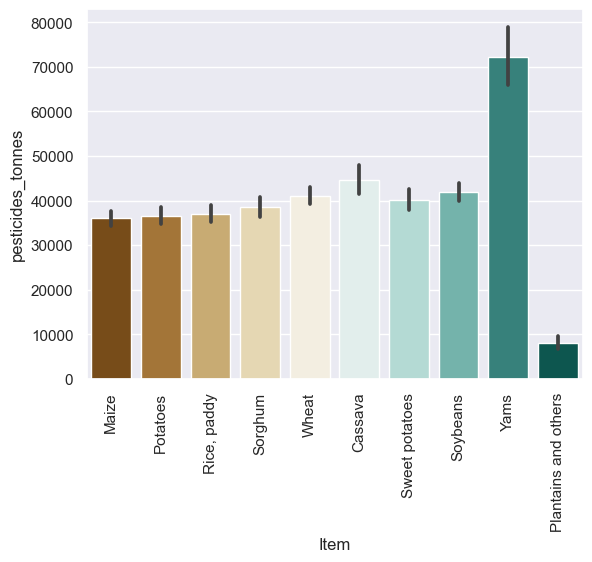

In [42]:
# Create a barplot using Seaborn with data from DataFrame 'df'
# The x-axis represents the 'Item' column, and the y-axis represents the 'pesticides_tonnes' column
# The 'BrBG' palette is used for coloring the bars
sns.barplot(data=df, x=df.Item, y=df['pesticides_tonnes'], palette='BrBG')

# Rotate the x-axis labels by 90 degrees for better readability
plt.xticks(rotation=90)

# Display the barplot
plt.show()

In [43]:
# Conclusion:

# Top pesticides used on items: Yams
# Least pesticides used on items: Plantains and others

<Axes: xlabel='Item', ylabel='hg/ha_yield'>

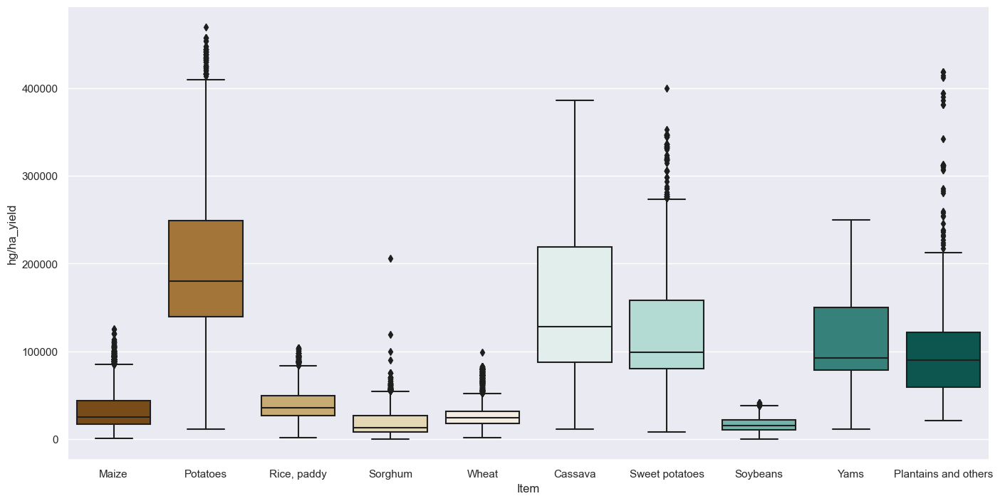

In [44]:
# Define the figure size as A4 dimensions (16.7 inches in width, 8.27 inches in height)
a4_dims = (16.7, 8.27)

# Create a figure and axes with the specified figsize
fig, ax = plt.subplots(figsize=a4_dims)

# Create a boxplot using Seaborn with data from DataFrame 'df'
# The x-axis represents the 'Item' column, and the y-axis represents the 'hg/ha_yield' column
# The 'BrBG' palette is used for coloring the boxes
sns.boxplot(x="Item", y="hg/ha_yield", palette="BrBG", data=df, ax=ax)

In [45]:
# Conclusion:

# Top producing items: potatoes, cassava
# Least producing items: soybeans, sorghum, wheat, maize, and rice, paddy

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'Maize'),
  Text(1, 0, 'Potatoes'),
  Text(2, 0, 'Rice, paddy'),
  Text(3, 0, 'Sorghum'),
  Text(4, 0, 'Wheat'),
  Text(5, 0, 'Cassava'),
  Text(6, 0, 'Sweet potatoes'),
  Text(7, 0, 'Soybeans'),
  Text(8, 0, 'Yams'),
  Text(9, 0, 'Plantains and others')])

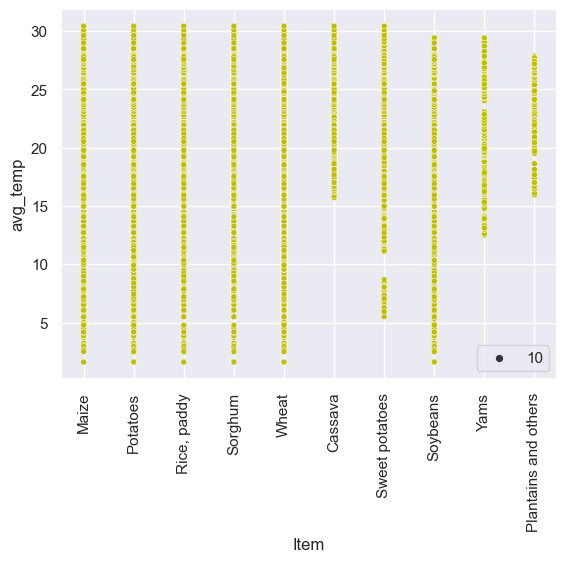

In [46]:
# Create a scatterplot using Seaborn with data from DataFrame 'df'
# The x-axis represents the 'Item' column, and the y-axis represents the 'avg_temp' column
# The 'size' parameter sets the marker size to 10, and the 'color' parameter sets the marker color to yellow ('y')
sns.scatterplot(x='Item', y='avg_temp', data=df, size=10, color='y')

# Rotate the x-axis labels by 90 degrees for better readability
plt.xticks(rotation=90)

In [47]:
# Conclusion:

# Cassava, Yams, and Plantains and others need more than 15 avg temperature to grow
# all other items can grow at any temperature range

In [48]:
# Group the DataFrame 'df' by the 'Item' column
grouped = df.groupby('Item')

# Create an empty list to store the best areas for each item
best_areas = []

# Iterate through each item group
for item, group in grouped:
    # Find the row with the maximum 'hg/ha_yield' value within the current group
    max_production_row = group[group['hg/ha_yield'] == group['hg/ha_yield'].max()]
    
    # Extract the 'Area' and 'hg/ha_yield' values for the maximum production row
    area = max_production_row['Area'].values[0]
    production = max_production_row['hg/ha_yield'].values[0]
    
    # Append a dictionary with item, area, and production information to the 'best_areas' list
    best_areas.append({'Item': item, 'Area': area, 'hg/ha_yield': production})

# Create a DataFrame 'best_areas_df' from the list of best areas
best_areas_df = pd.DataFrame(best_areas)

# Display the DataFrame containing the best areas for each item
best_areas_df

,Item,Area,hg/ha_yield
0,Cassava,India,385818
1,Maize,Tajikistan,125670
2,Plantains and others,Guatemala,418505
3,Potatoes,France,468991
4,"Rice, paddy",Australia,103895
5,Sorghum,Algeria,206000
6,Soybeans,Turkey,41609
7,Sweet potatoes,Senegal,400000
8,Wheat,Zambia,99387
9,Yams,Mali,250000


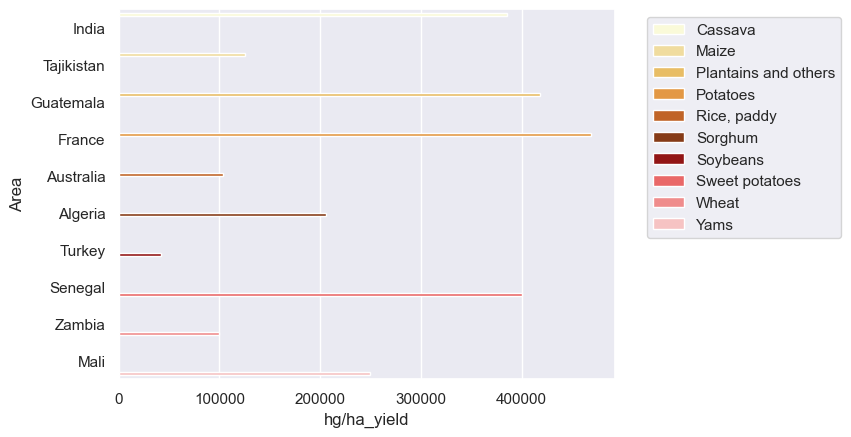

In [49]:
# Create a barplot using Seaborn with data from the DataFrame 'best_areas_df'
# The x-axis represents the 'hg/ha_yield' column, and the y-axis represents the 'Area' column
# The 'hue' parameter is set to 'Item' for color differentiation based on item
# The 'palette' parameter is set to the 'colorss.yellows' palette for coloring the bars
ax = sns.barplot(data=best_areas_df, x='hg/ha_yield', y='Area', hue='Item', palette=colorss.yellows)

# Move the legend outside the plot area to the upper left
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Display the barplot
plt.show()

In [50]:
# Conclusion:

# Cassava: India is the top at producing Cassava
# Maize: Tajikistan excels at growing Maize
# PLantains and others: Guatemala is the best source of PLantains and others
# Potatoes: France is the top at producing potatoes
# Rice, paddy: Australia is the leading country in producing rice, paddy
# Sorghum: Algeria excels at producing sorghum
# Soybeans: Turkey is unrivalled in producing soybeans
# Sweet potatoes: Senegal is the best at producing sweet potatoes
# Wheat: Zambbia surpasses every country at producing wheat
# Yams: Mali outshines all countries in growing yams

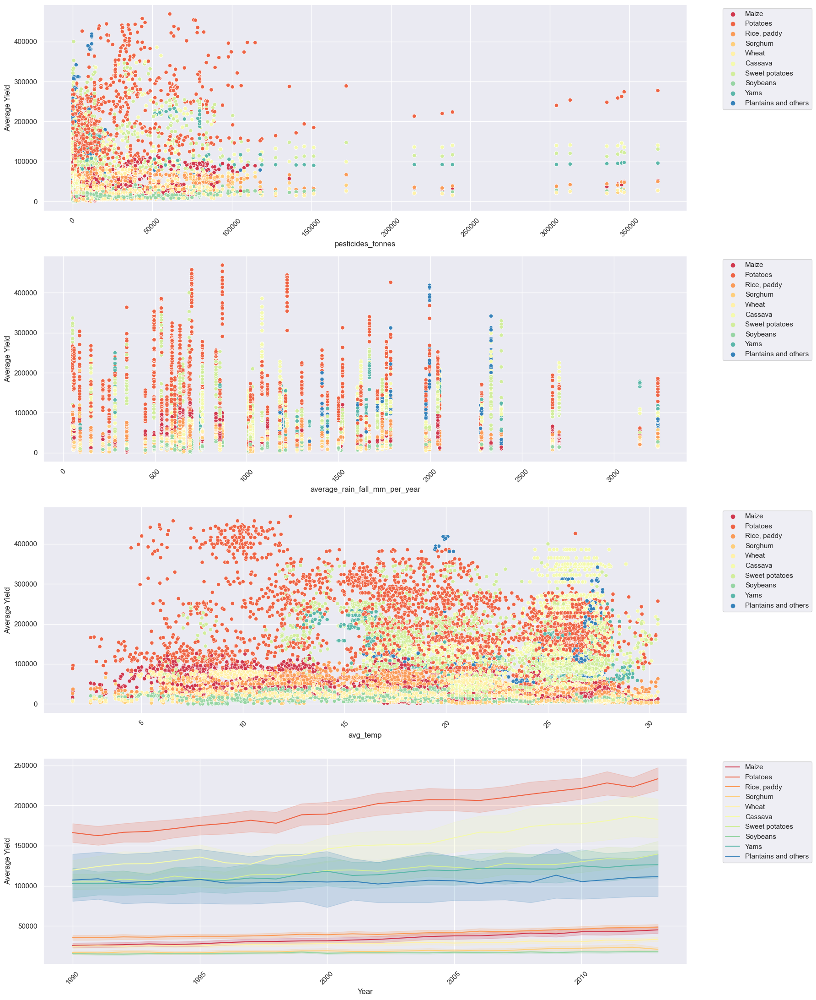

In [51]:
# Create a 4x1 grid of subplots with the specified figure size
fig, axes = plt.subplots(4, 1, figsize=(18, 22))

# Scatter plot 1: Pesticides vs. Average Yield
sns.scatterplot(x="pesticides_tonnes", y="hg/ha_yield", hue="Item", data=df, ax=axes[0], legend=True, palette='Spectral')
axes[0].tick_params(axis='x', rotation=45)
axes[0].set_ylabel('Average Yield')
axes[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Scatter plot 2: Average Rainfall vs. Average Yield
sns.scatterplot(x="average_rain_fall_mm_per_year", y="hg/ha_yield", hue="Item", data=df, ax=axes[1], legend=True, palette='Spectral')
axes[1].tick_params(axis='x', rotation=45)
axes[1].set_ylabel('Average Yield')
axes[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Scatter plot 3: Average Temperature vs. Average Yield
sns.scatterplot(x="avg_temp", y="hg/ha_yield", hue="Item", data=df, ax=axes[2], legend=True, palette='Spectral')
axes[2].tick_params(axis='x', rotation=45)
axes[2].set_ylabel('Average Yield')
axes[2].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Line plot: Year vs. Average Yield
sns.lineplot(x="Year", y="hg/ha_yield", hue="Item", data=df, ax=axes[3], legend=True, palette='Spectral')
axes[3].tick_params(axis='x', rotation=45)
axes[3].set_ylabel('Average Yield')
axes[3].legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Ensure tight layout to prevent overlapping
plt.tight_layout()

# Display the subplots
plt.show()

In [52]:
# Conclusion:

# pesticidies_tonnes: it appears that production of items decreases as pesticides increases
# rainfall: it appears that production of items decreases as rainfall increases for more than 2500
# avg_temp: it shows that average yield decreases as average temperature decreases below 5

In [53]:
def change_of_years(data, template='seaborn'):
    # Get the column names starting from the 4th column
    col = data.columns[3:].tolist()
    
    # Loop through each column
    for i in col:
        # Create a line plot of the mean of the column over the years
        sns.lineplot(data=data.groupby(['Year'])[i].mean(), color='brown')
        
        # Set the title of the plot dynamically based on the current column
        plt.title(f'Effect of Years on {i}')
        
        # Display the plot
        plt.show()
        
        # Yield control back to the calling code
        yield()

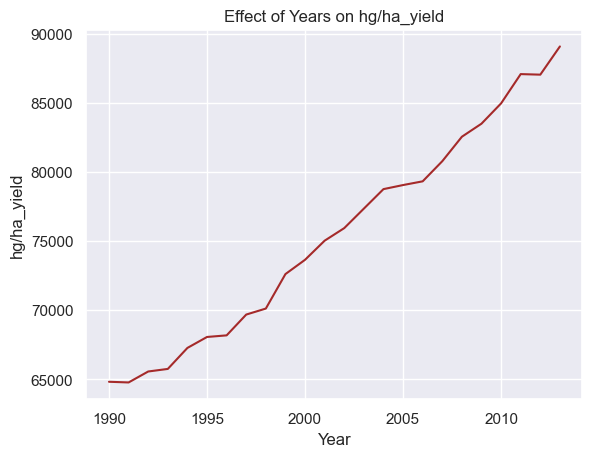

()

In [54]:
# Create a generator for generating and displaying the plots
yplot = change_of_years(df)

# Generate and display the first plot
next(yplot)

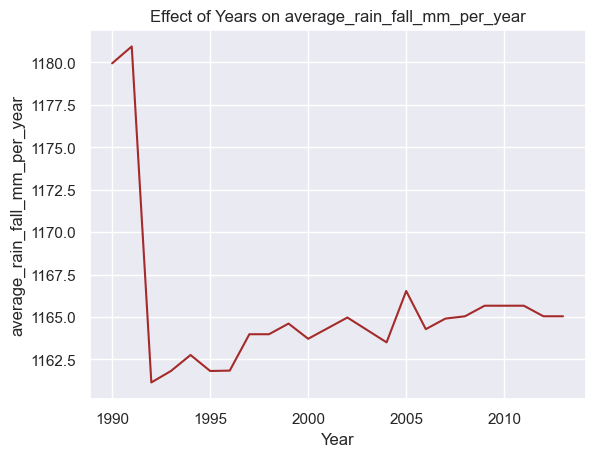

In [55]:
next(yplot);

In [56]:
# Conclusion:

# pesticides have been increasing significantly since 2003

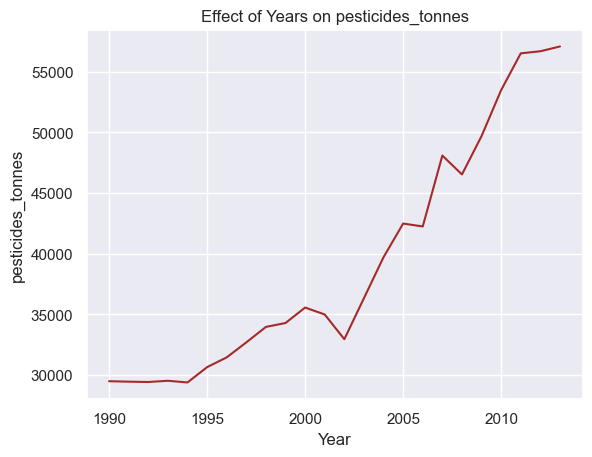

In [57]:
next(yplot);

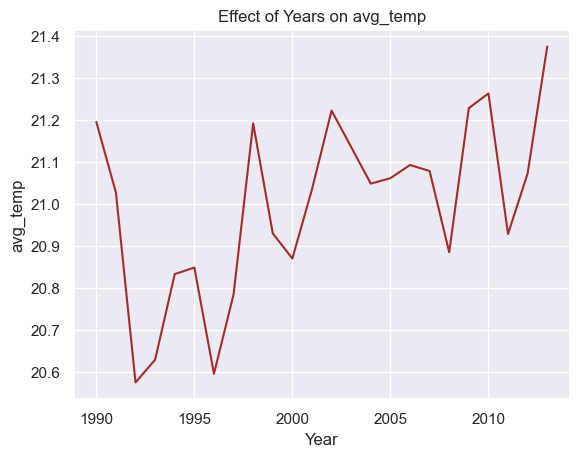

In [58]:
next(yplot);

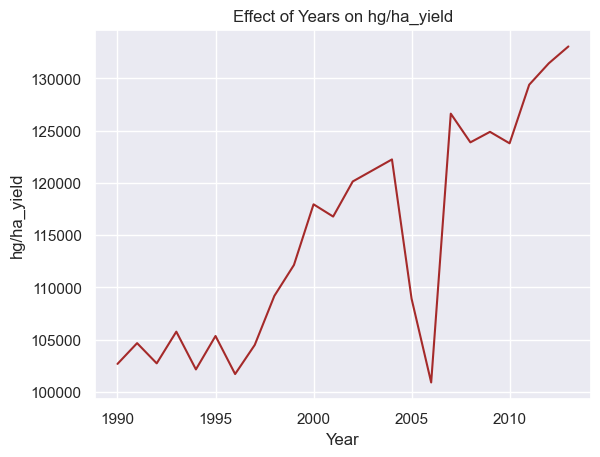

()

In [59]:
# Select a subset of the DataFrame 'df' where the 'Area' is 'Egypt'
df_Egypt = df.loc[df['Area'] == 'Egypt']

# Create a generator to generate and display plots showing the effect of years on different columns
yplot = change_of_years(df_Egypt)

# Generate and display the first plot for the subset of data where 'Area' is 'Egypt'
next(yplot)

In [60]:
# Conclusion:

# A significant decrease in pesticides occurred between 1993-2005 then it increased even higher than its starting value

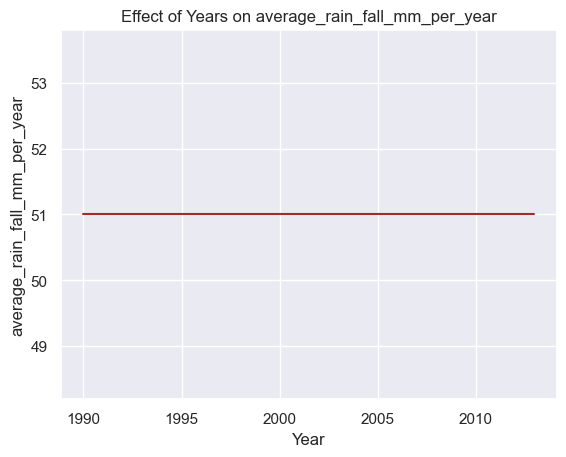

In [61]:
next(yplot);

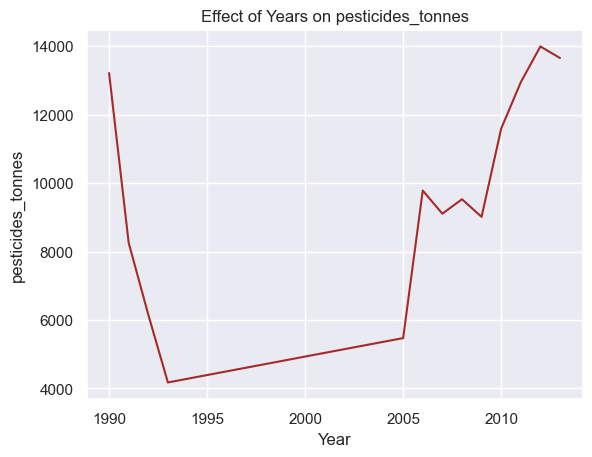

In [62]:
next(yplot);

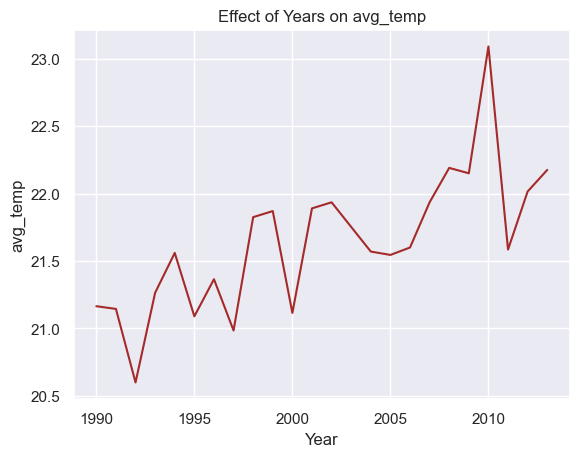

In [63]:
next(yplot);

In [64]:
# Model building and evaluation

In [66]:
# Import necessary libraries for regression modeling and evaluation
from sklearn.linear_model import LinearRegression  # Linear Regression model
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor  # Random Forest and Gradient Boosting Regressors
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error  # Regression metrics
from xgboost import XGBRegressor  # XGBoost Regressor
from sklearn.model_selection import train_test_split  # Splitting data into training and testing sets
from sklearn.preprocessing import LabelEncoder, StandardScaler  # Data preprocessing tools (LabelEncoder and StandardScaler)
from sklearn.model_selection import cross_val_score, KFold  # Cross-validation and K-Fold validation
from sklearn.neighbors import KNeighborsRegressor  # K-Nearest Neighbors Regressor
from sklearn.tree import DecisionTreeRegressor  # Decision Tree Regressor
from sklearn.ensemble import BaggingRegressor  # Bagging Regressor (Ensemble method)

In [67]:
# Split the dataset into feature matrix X and target variable y
X, y = datacorr.drop(labels='hg/ha_yield', axis=1), datacorr['hg/ha_yield']

In [68]:
# Split the dataset into training and testing sets with a 70-30 ratio
# Setting a random seed for reproducibility with random_state=42
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

The accuracy of the Linear Regression Model Train is 7.39
The accuracy of the Linear Regression Model Test is 7.37


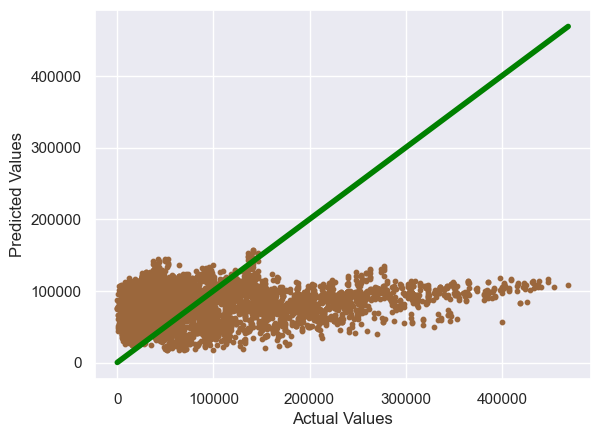

The accuracy of the Random Forest Model Train is 99.80
The accuracy of the Random Forest Model Test is 98.56


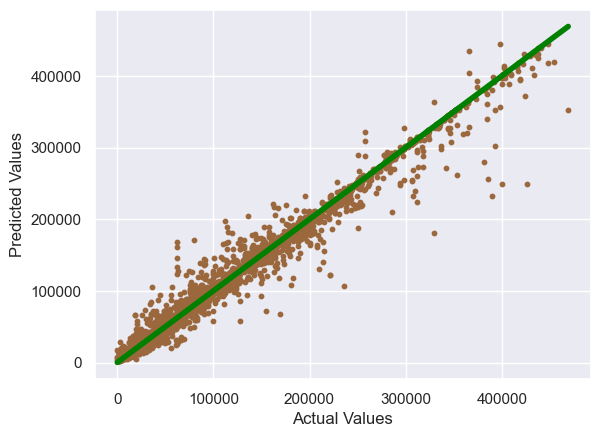

The accuracy of the Gradient Boost Model Train is 84.47
The accuracy of the Gradient Boost Model Test is 83.11


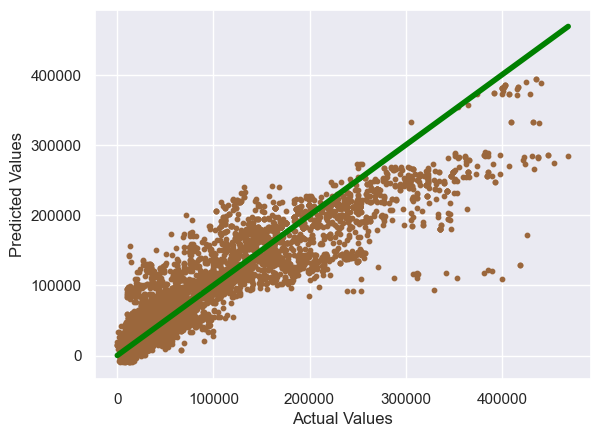

The accuracy of the XGBoost Model Train is 98.72
The accuracy of the XGBoost Model Test is 97.33


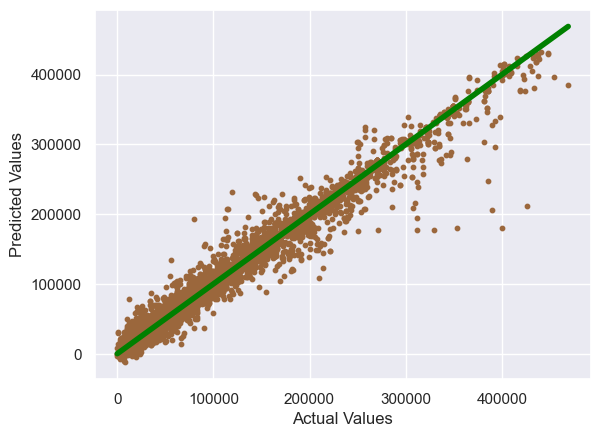

The accuracy of the KNN Model Train is 56.73
The accuracy of the KNN Model Test is 28.90


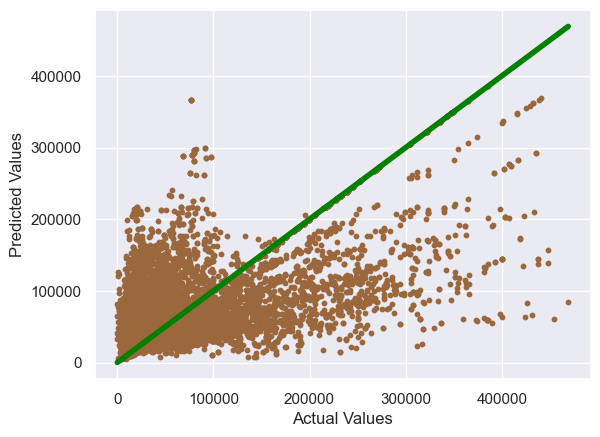

The accuracy of the Decision Tree Model Train is 100.00
The accuracy of the Decision Tree Model Test is 97.62


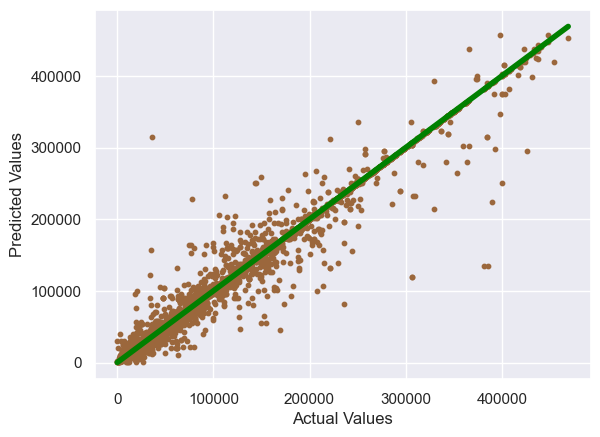

The accuracy of the Bagging Regressor Model Train is 99.81
The accuracy of the Bagging Regressor Model Test is 98.59


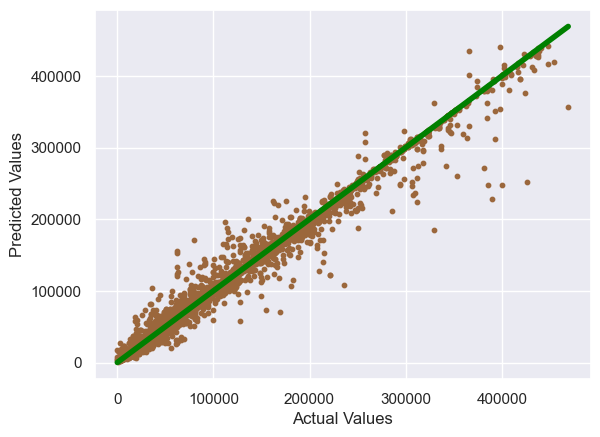

,Model,Accuracy,MSE,R2_score
0,Linear Regression,0.073724,6293718529.871158,0.073724
1,Random Forest,0.985628,97654323.573225,0.985628
2,Gradient Boost,0.831140,1147345777.258148,0.831140
3,XGBoost,0.973256,181714671.361342,0.973256
4,KNN,0.289040,4830726834.121146,0.289040
5,Decision Tree,0.976174,161890347.543726,0.976174
6,Bagging Regressor,0.985881,95933983.565644,0.985881


In [69]:
# Initialize an empty list to store the results
results = []

# Define a list of regression models along with their names
models = [
    ('Linear Regression', LinearRegression()),
    ('Random Forest', RandomForestRegressor(random_state=42)),
    ('Gradient Boost', GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)),
    ('XGBoost', XGBRegressor(random_state=42)),
    ('KNN', KNeighborsRegressor(n_neighbors=5)),
    ('Decision Tree', DecisionTreeRegressor(random_state=42)),
    ('Bagging Regressor', BaggingRegressor(n_estimators=150, random_state=42))
]

# Loop through each model and perform training, prediction, and evaluation
for name, model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # Calculate accuracy, mean squared error (MSE), and R-squared score
    accuracy = model.score(X_test, y_test)
    MSE = mean_squared_error(y_test, y_pred)
    R2_score = r2_score(y_test, y_pred)
    
    # Append the results to the 'results' list
    results.append((name, accuracy, MSE, R2_score))
    
    # Calculate and print the accuracy for both training and testing data
    acc_train = (model.score(X_train , y_train) * 100)
    print(f'The accuracy of the {name} Model Train is {acc_train:.2f}')
    acc_test = (model.score(X_test , y_test) * 100)
    print(f'The accuracy of the {name} Model Test is {acc_test:.2f}')    
    
    # Create a scatter plot of actual vs. predicted values
    plt.scatter(y_test, y_pred, s=10, color='#9B673C')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='green', linewidth=4)
    plt.show()

# Create a DataFrame from the results and style it for display
dff = pd.DataFrame(results, columns=['Model', 'Accuracy', 'MSE', 'R2_score'])
df_styled_best = dff.style.highlight_max(subset=['Accuracy', 'R2_score'], color='green').highlight_min(subset=['MSE'], color='green').highlight_max(subset=['MSE'], color='red').highlight_min(subset=['Accuracy', 'R2_score'], color='red')

# Display the styled DataFrame
display(df_styled_best)

In [70]:
# K-fold

In [71]:
# Initialize an empty list to store the results
results = []

# Define a list of regression models along with their names
models = [
    ('Linear Regression', LinearRegression()),
    ('Random Forest', RandomForestRegressor(random_state=42)),
    ('Gradient Boost', GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)),
    ('XGBoost', XGBRegressor(random_state=42)),
    ('KNN', KNeighborsRegressor(n_neighbors=5)),
    ('Decision Tree', DecisionTreeRegressor(random_state=42)),
    ('Bagging Regressor', BaggingRegressor(n_estimators=150, random_state=42))
]

# Loop through each model and perform training, prediction, and evaluation
for name, model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # Calculate accuracy, mean squared error (MSE), mean absolute error (MAE),
    # mean absolute percentage error (MAPE), and R-squared score
    accuracy = model.score(X_test, y_test)
    MSE = mean_squared_error(y_test, y_pred)
    MAE = mean_absolute_error(y_test, y_pred)
    MAPE = mean_absolute_percentage_error(y_test, y_pred)
    R2_score = r2_score(y_test, y_pred)
    
    # Append the results to the 'results' list
    results.append((name, accuracy, MSE, MAE, MAPE, R2_score))
    
    # Print the name of the model
    print(name)
    
    # Perform k-fold cross-validation (with 5 folds) and print individual fold scores
    num_folds = 5
    kf = KFold(n_splits=num_folds, shuffle=True)
    scores = cross_val_score(model, X, y, cv=kf)
    
    for fold, score in enumerate(scores):
        print(f"Fold {fold+1}: {score}")
    
    # Calculate and print the mean score across all folds
    mean_score = np.mean(scores)
    print(f"Mean Score: {mean_score}")
    print('-' * 30)

# Create a DataFrame from the results and style it for display
df = pd.DataFrame(results, columns=['Model', 'Accuracy', 'MSE', 'MAE', 'MAPE', 'R2_score'])
df_styled_best = df.style.highlight_max(subset=['Accuracy', 'R2_score'], color='lightblue').highlight_min(subset=['MSE', 'MAE', 'MAPE'], color='lightblue').highlight_max(subset=['MSE', 'MAE', 'MAPE'], color='red').highlight_min(subset=['Accuracy', 'R2_score'], color='red')

# Display the styled DataFrame
display(df_styled_best)

Linear Regression
Fold 1: 0.07414562077208242
Fold 2: 0.07088870609002096
Fold 3: 0.06987859910980665
Fold 4: 0.0761686656017252
Fold 5: 0.0761221365697129
Mean Score: 0.07344074562866962
------------------------------
Random Forest
Fold 1: 0.9866958320263811
Fold 2: 0.9867416090799809
Fold 3: 0.9888748980052892
Fold 4: 0.988528567229485
Fold 5: 0.9881061134848278
Mean Score: 0.9877894039651928
------------------------------
Gradient Boost
Fold 1: 0.8276619959474517
Fold 2: 0.8396349450139
Fold 3: 0.8430606145357344
Fold 4: 0.8333777054792694
Fold 5: 0.8470897867548168
Mean Score: 0.8381650095462344
------------------------------
XGBoost
Fold 1: 0.9798413523525948
Fold 2: 0.9723984330564618
Fold 3: 0.9770227086945492
Fold 4: 0.9758983791155635
Fold 5: 0.9754871582831857
Mean Score: 0.9761296063004711
------------------------------
KNN
Fold 1: 0.3444058233185039
Fold 2: 0.33721224239577907
Fold 3: 0.32613381764048055
Fold 4: 0.3717674729068975
Fold 5: 0.31167839443346723
Mean Score: 0.3

,Model,Accuracy,MSE,MAE,MAPE,R2_score
0,Linear Regression,0.073724,6293718529.871158,60955.317749,2.419536,0.073724
1,Random Forest,0.985628,97654323.573225,3480.841065,0.102571,0.985628
2,Gradient Boost,0.831140,1147345777.258148,21184.660834,0.596784,0.831140
3,XGBoost,0.973256,181714671.361342,7341.948649,0.208728,0.973256
4,KNN,0.289040,4830726834.121146,47667.896781,1.624089,0.289040
5,Decision Tree,0.976174,161890347.543726,3559.269202,0.096101,0.976174
6,Bagging Regressor,0.985881,95933983.565644,3450.508398,0.101199,0.985881


In [72]:
# Analysis:

# Random Forest and Bagging Regressor Perform Best: The models "Random Forest" and "Bagging Regressor" achieve the highest accuracy (R-squared score) among all the models, with approximately 98.56% accuracy
# Gradient Boost and XGBoost Follow Closely: The "Gradient Boost" and "XGBoost" models also demonstrate good performance, with R-squared scores of approximately 83.11% and 97.33%, respectively
# Decision Tree Is Competitive: The "Decision Tree" model also performs well, with an R-squared score of approximately 97.62%
# Linear Regression Lags Behind: The "Linear Regression" model performs the least effectively among the models, with an R-squared score of only approximately 7.37%. Linear regression may not be suitable for capturing non-linear relationships in the data
# KNN Has Relatively Low Accuracy: The "KNN" (K-Nearest Neighbors) model exhibits lower accuracy compared to the other models, with an R-squared score of approximately 28.90%. KNN may not be well-suited for this dataset or may require further parameter tuning
# MSE, MAE, and MAPE Metrics: The Mean Squared Error (MSE), Mean Absolute Error (MAE), and Mean Absolute Percentage Error (MAPE) metrics provide additional insights into model performance. Models with lower MSE and MAE values tend to make more accurate predictions
# Consider Ensembling Methods: Random Forest, Bagging Regressor, Gradient Boost, and XGBoost are strong performers, suggesting that ensemble methods can be effective for this regression task

# Conclusion:

# Random Forest and Bagging Regressor are top choices for high accuracy, but Gradient Boost and XGBoost also perform well and may provide better interpretability